In this step, we will perform feature selection and dimensionality reduction of the dataset for the downstream analysis. 

We will perform the analysis on different subsets of the data to have a better insight of it.

In [1]:
import warnings
warnings.filterwarnings("ignore") 

import scanpy as scp
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import numpy as np
import pandas as pd
from mpl_toolkits.axes_grid.inset_locator import inset_axes
import os

from parameters import *

import sys
sys.path.append('../')
import single_cell_tools.tools as scttools
import single_cell_tools.plot as sctplot
import single_cell_tools.hyperparameter_selection as scthyp

# Full

In [2]:
adata = scp.read(DIRECTORY+"Results/QC.h5ad")

## HVGs and PCs

1. For the global projection, we make an automatic selection of highly varying genes according to the Seurat algorithm.
2. The variance plot show an elbow at 10 PCA. We chose that number of PCA for the downstream analysis: construction of the nearest neighbours graph and the UMAP projection.

In [3]:
scp.pp.highly_variable_genes(adata,layer=HVGS["layer"],flavor=HVGS["flavor"],n_top_genes=HVGS["n_top_genes"])
scp.pp.pca(adata,n_comps=100,use_highly_variable=True)

In [4]:
scthyp.pca_permutation_test(adata,use_HVGs=True,n_perms=50)

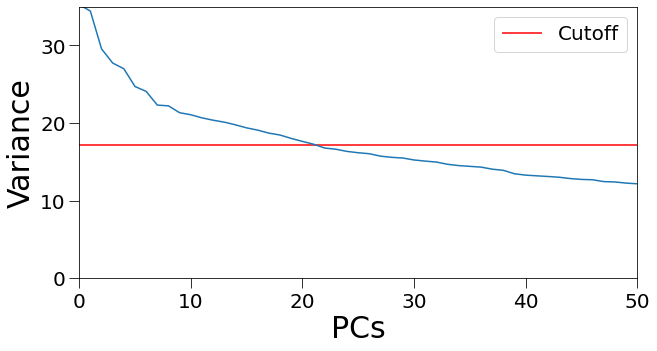

In [5]:
fig,ax = plt.subplots(figsize=[10,5])

sns.lineplot(range(len(adata.uns["pca"]["variance"])),adata.uns["pca"]["variance"],ax=ax)
sctplot.hline(ax,adata.uns["pca"]["variance_randomized_mean"].max(),label="Cutoff",color="r")
sctplot.plot_base(ax,labels=["PCs","Variance"],axis=[0,50,0,35])

fig.savefig(DIRECTORY+"Plots/DR_PCs_selection.pdf",bbox_inches="tight",transparent=True)
fig.show()

## UMAP projection by tags 

With the PCs selected, we can generate a neighbors graph and project over a UMAP plot.

In [6]:
scp.pp.neighbors(adata,metric=METRIC,n_pcs=PCA,knn=KNN)
scp.tl.umap(adata)

2022-08-22 08:48:14.330747: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-22 08:48:14.330763: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


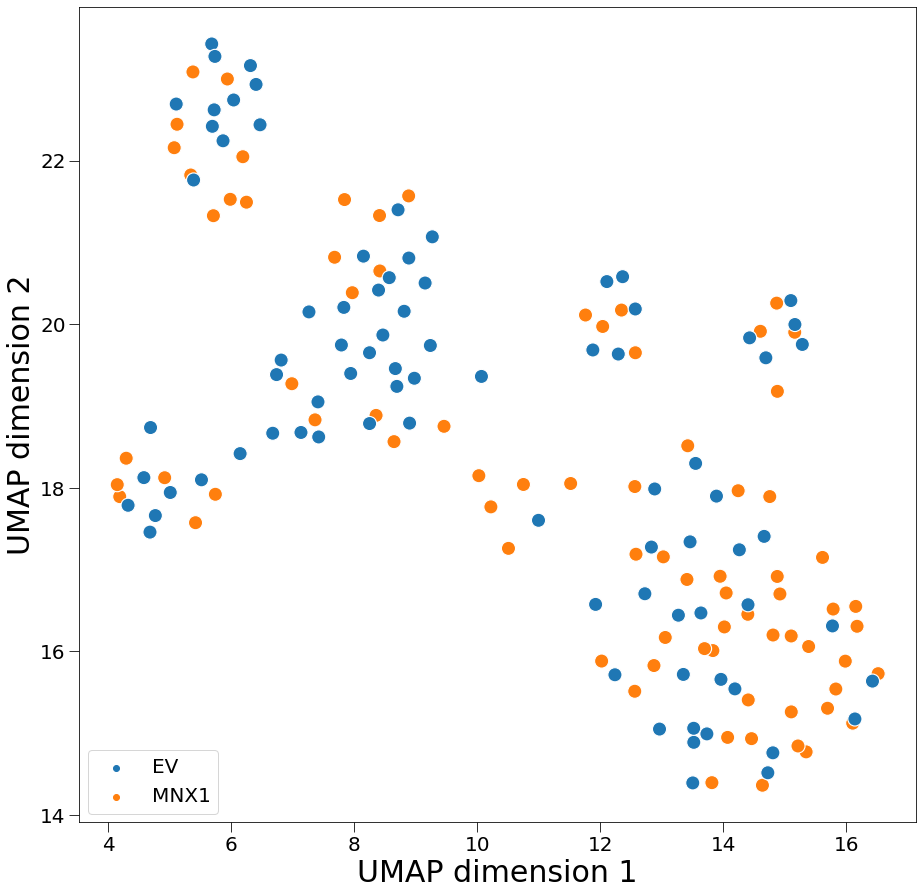

In [7]:
fig,ax = plt.subplots(1,figsize=[15,15])
        
sns.scatterplot(x=adata.obsm["X_umap"][:,0],y=adata.obsm["X_umap"][:,1],hue=adata.obs["Condition"],s=200,ax=ax)
sctplot.plot_base(ax,labels=["UMAP dimension 1","UMAP dimension 2"],legend_pos=(0.01,0.01))

fig.savefig(DIRECTORY+"Plots/UMAP_tags.pdf",bbox_inches="tight",transparent=True)

## UMAP projection of relevant genes

We projected over the UMAP a list of relevant genes that will be helpful for the future annotation of the dataset. Notice that some of the genes may not be found, this may be caused because they are tagged with a different name or that no expression at all from this genes has been detected.

In [8]:
genes = pd.read_excel("../Shared_data/Marker_genes_scRNAseq_Gx.xlsx",header=None)

print("Genes selected for projection: ",np.sort(genes.values[:,0]))

Genes selected for projection:  ['Bcl11b' 'Bmi1' 'Cbfa2t3' 'Ccn3' 'Cd24a' 'Cd34' 'Cd48' 'Cd93' 'Cdh5'
 'Cebpa' 'Ebf1' 'Esam' 'Etv6' 'Fcgr3' 'Flt3' 'Foxo3' 'Gata1' 'Gata2'
 'Gata3' 'Gfi1b' 'Hbb-bh1' 'Hbb-bs' 'Hbb-bt' 'Hbb-y' 'Hlf' 'Hoxa9' 'Hoxb4'
 'Ifitm1' 'Ifitm2' 'Ifitm3' 'Itga2b' 'Kdr' 'Kit' 'Klf1' 'Ly6a' 'Ly6e'
 'Mecom' 'Meis1' 'Mllt3' 'Nkx2-5' 'Notch1' 'Notch2' 'Pax5' 'Pcgf2'
 'Pdgfra' 'Pecam1' 'Ptprc' 'Robo4' 'Runx1' 'Slamf1' 'Snap25' 'Spi1' 'Spn'
 'Srrm4' 'Stmn2' 'T' 'Tbx5' 'Tcf3']


Genes from the list not found for projection:  []


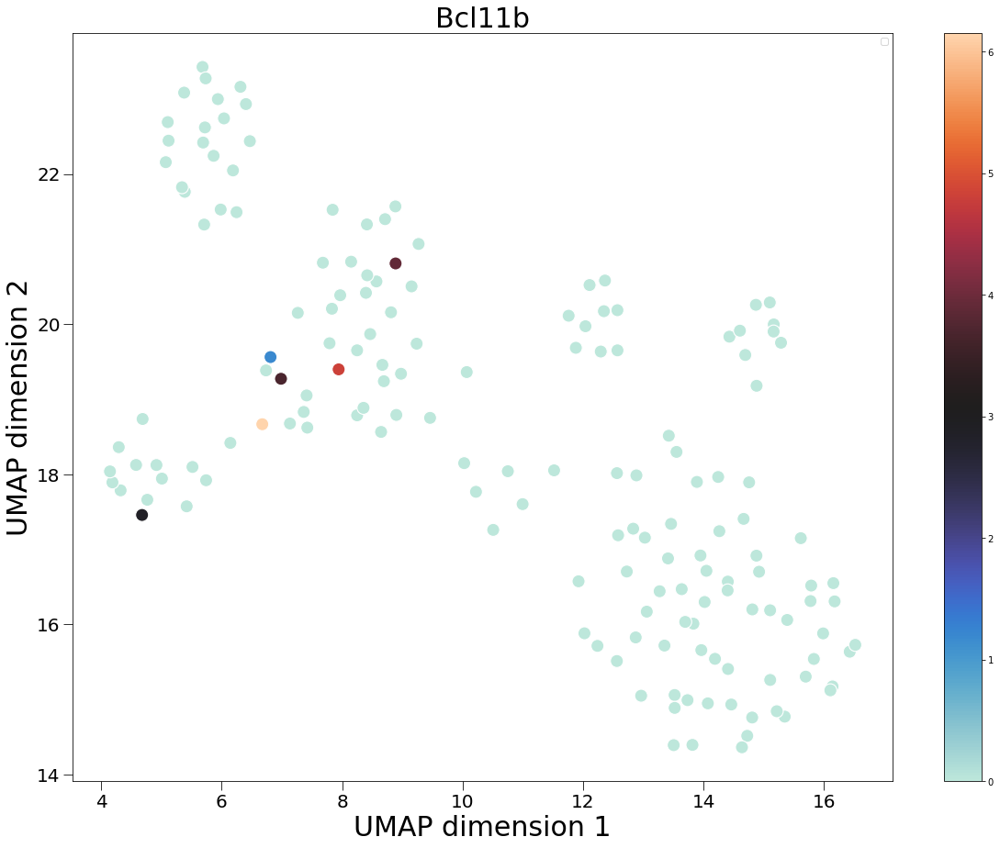

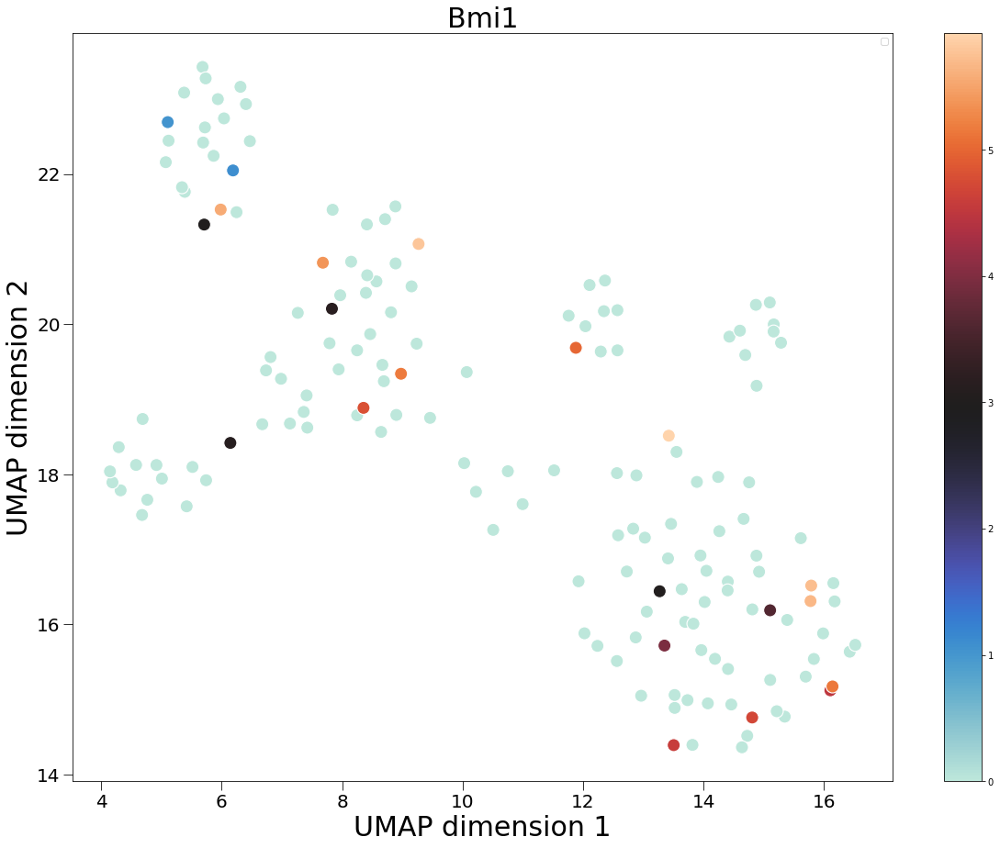

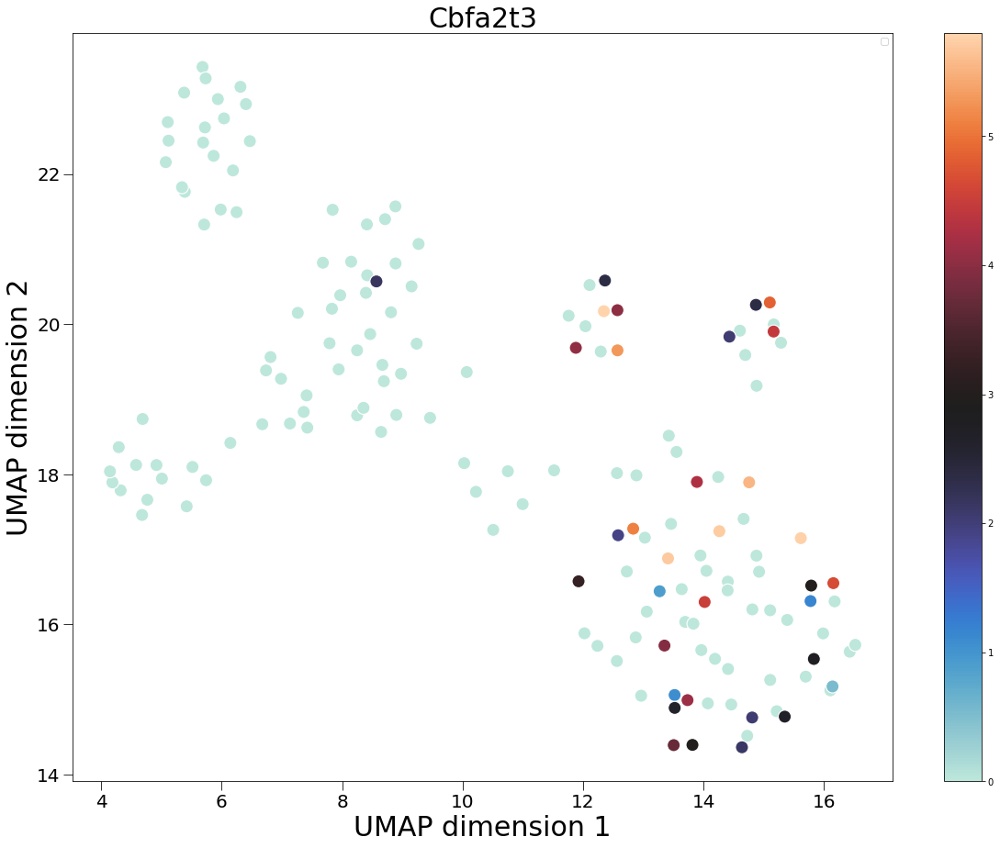

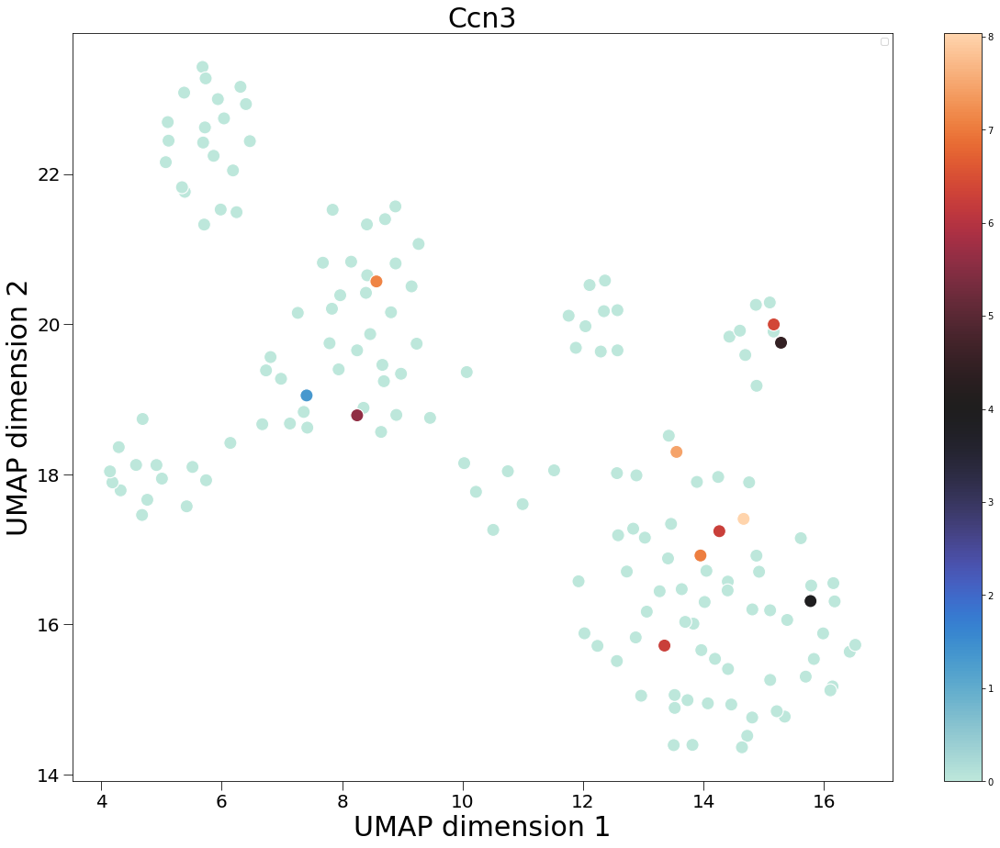

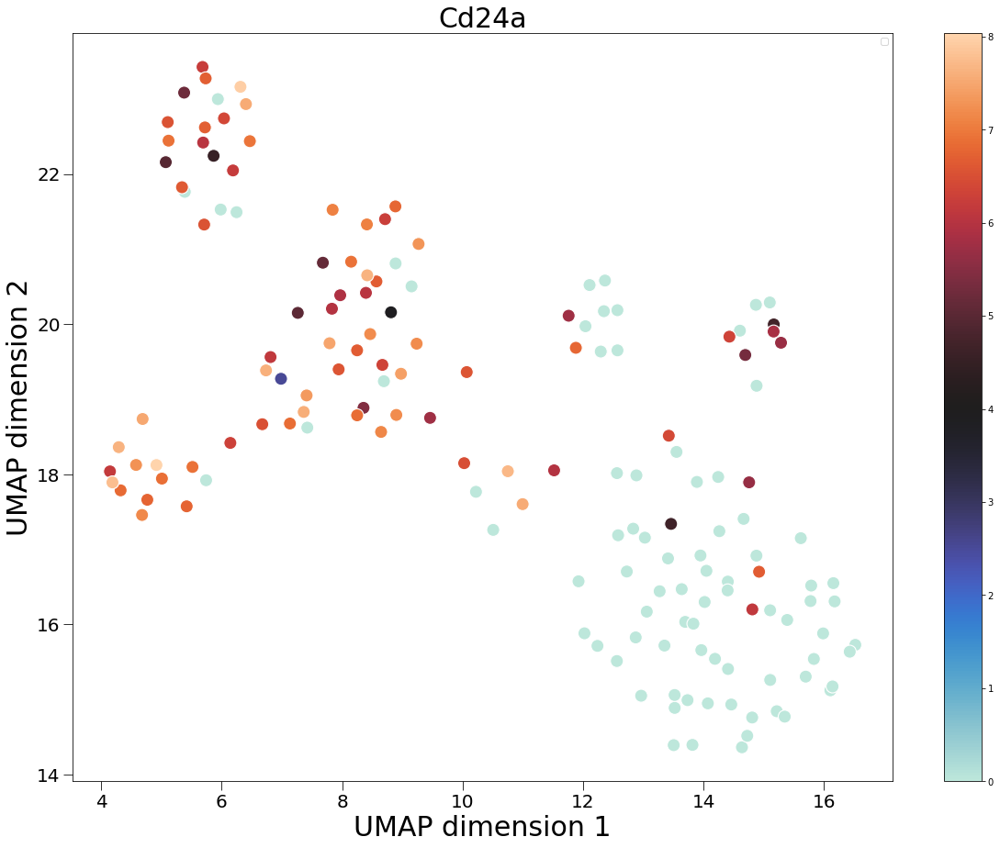

...

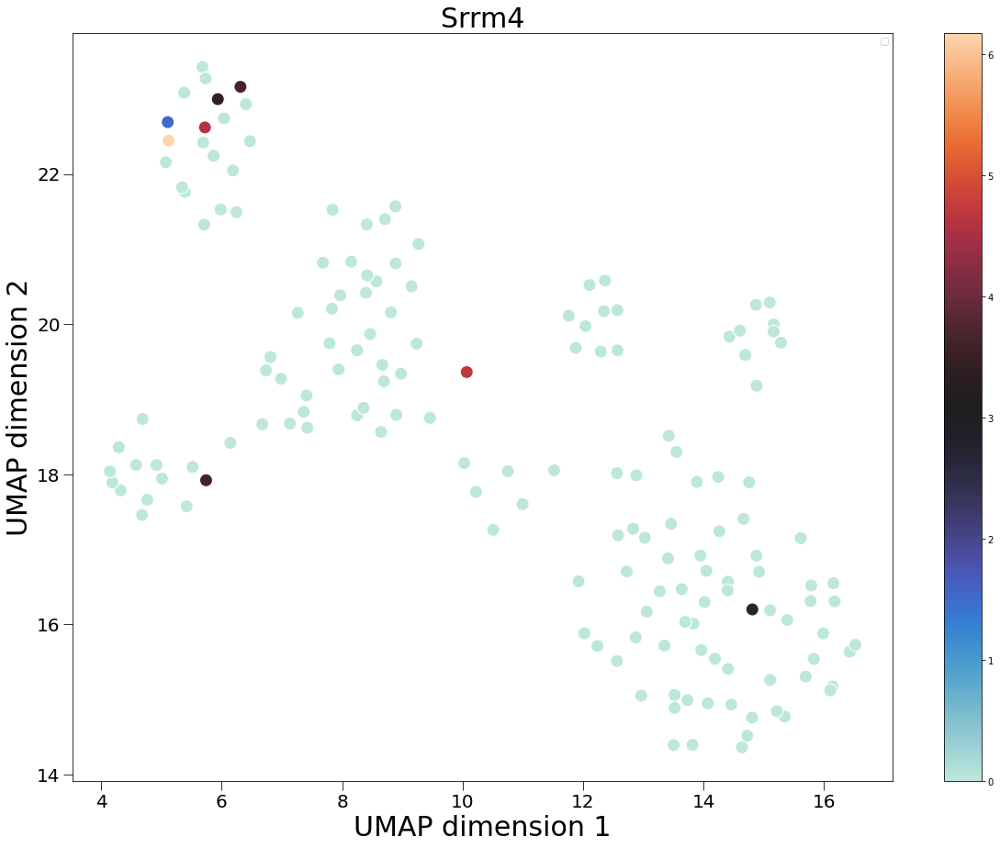

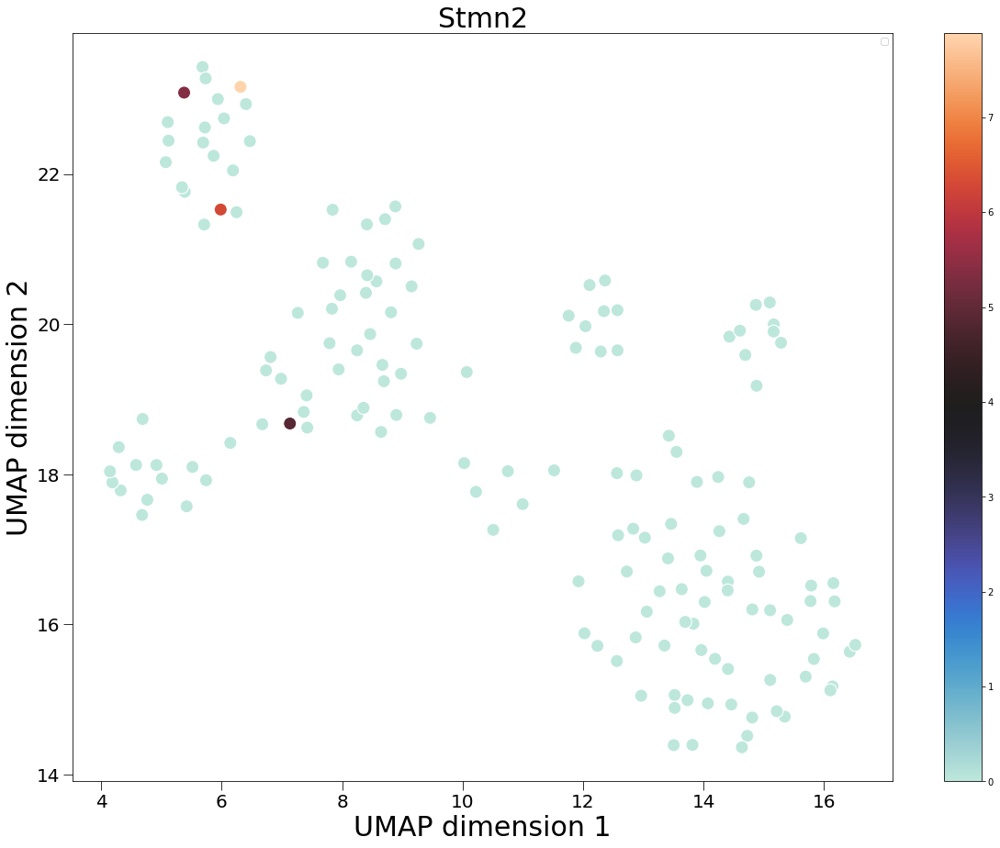

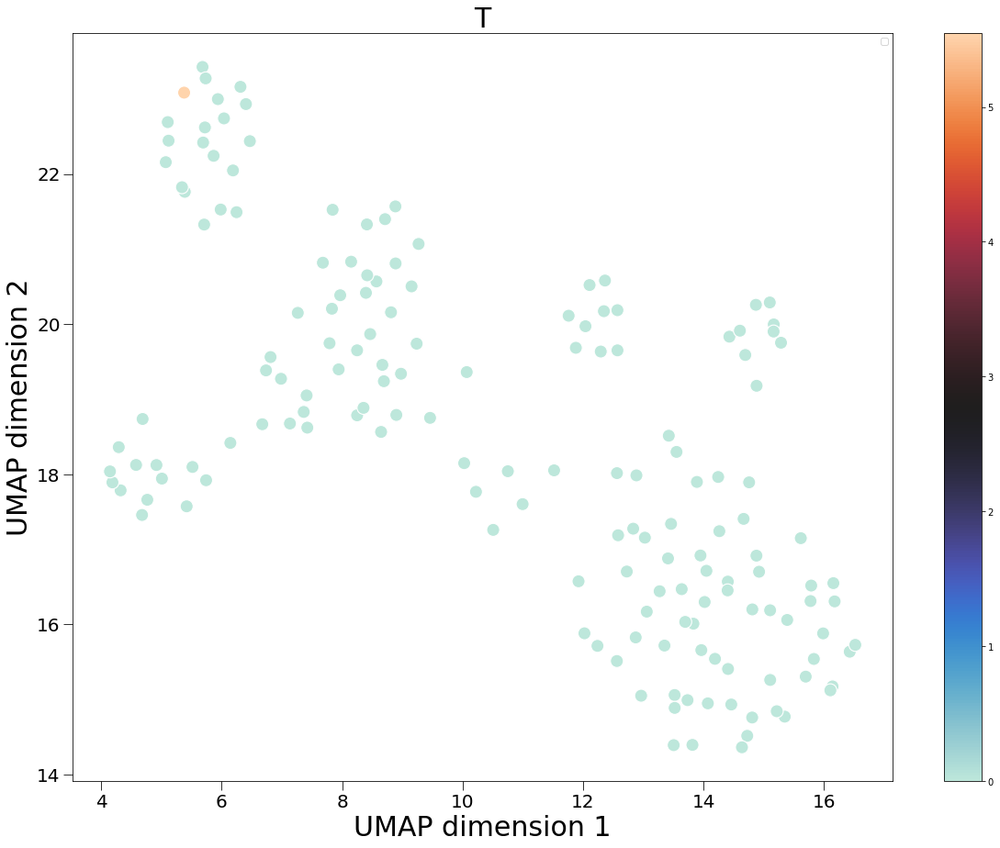

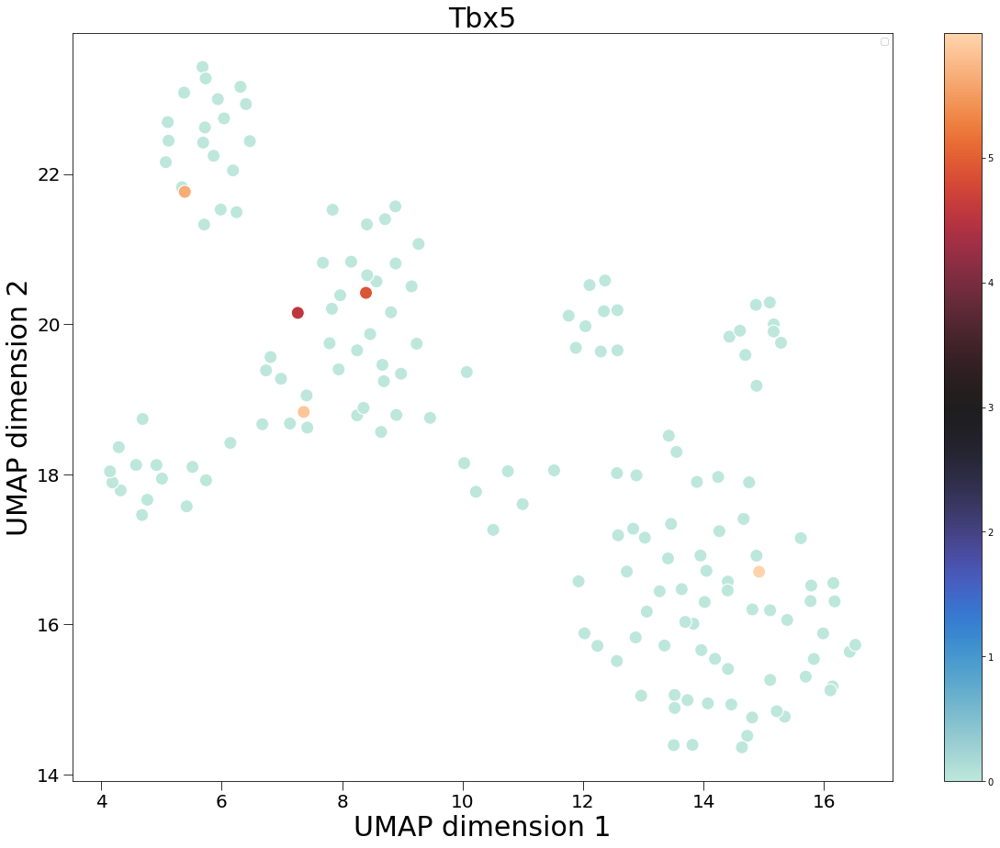

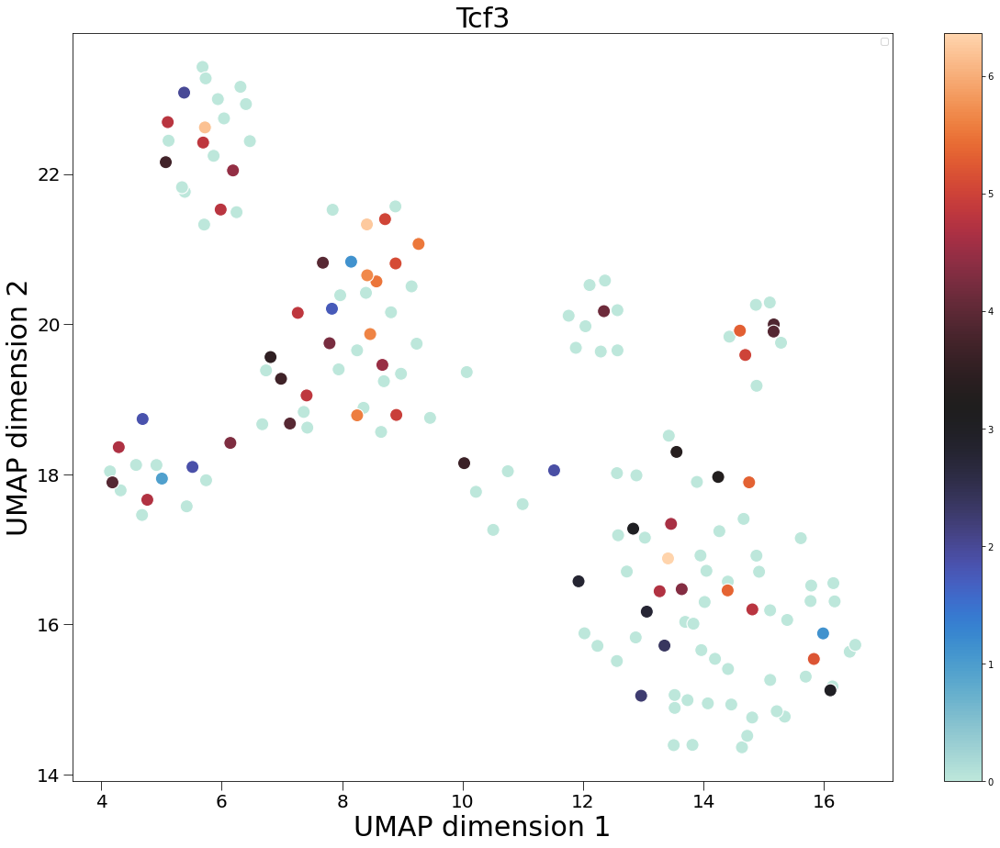

In [9]:
not_found_genes = []
for gene in np.sort(genes.values[:,0]):
        
    if gene in np.sort(adata.var.loc[:,"gene_name"].values):
        fig,ax = plt.subplots(1,1,figsize=[20,15])
        
        hue = np.array(adata[:,adata.var["gene_name"]==gene].X.todense())[:,0]
        order = np.argsort(hue)

        sns.scatterplot(x=adata.obsm["X_umap"][order,0],y=adata.obsm["X_umap"][order,1],s=200,hue=hue[order],ax=ax,palette=PALETTE)
        plt.colorbar(cm.ScalarMappable(norm=Normalize(min(hue),max(hue)), cmap=PALETTE),ax=ax)
        ax.legend([])
        sctplot.plot_base(ax,labels=["UMAP dimension 1","UMAP dimension 2"],title=gene,legend_pos=(0.01,0.01),legend_markerscale=3,legend=False)
                    
        fig.savefig(DIRECTORY+"Plots/UMAP_genes/"+gene+".pdf",bbox_inches="tight",transparent=True)
    else:
        not_found_genes.append(gene)
        
print("Genes from the list not found for projection: ",not_found_genes)

## UMAP projection of flow cytometry properties

We also plot the the data against the cytommetry properties used for the selection of the cells of the experiment.

In [10]:
properties = ['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H',
       'SSC-W', 'PE Dazzle 594 CD41 610/20 Y/G-A', 'APC CD45 660/20 Red-A',
       'APC Cy7 cKIT 780/60 Red-A', '450/40 Violet-A',
       'LssmOrange 610/20 Violet-A']

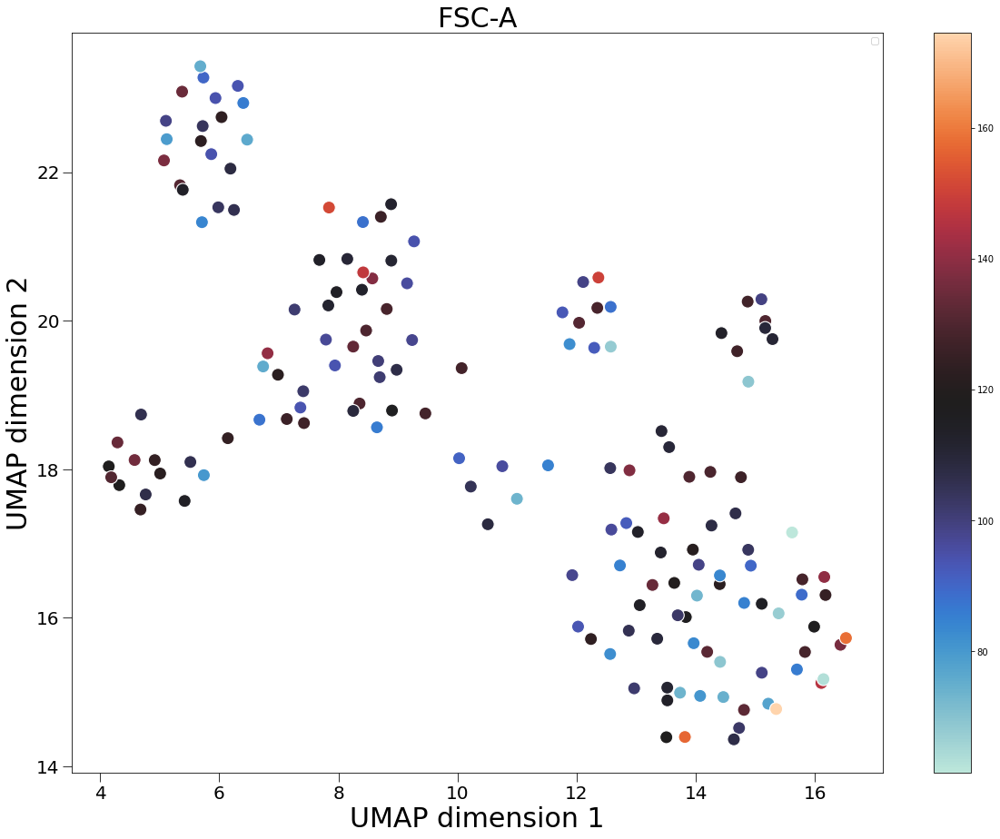

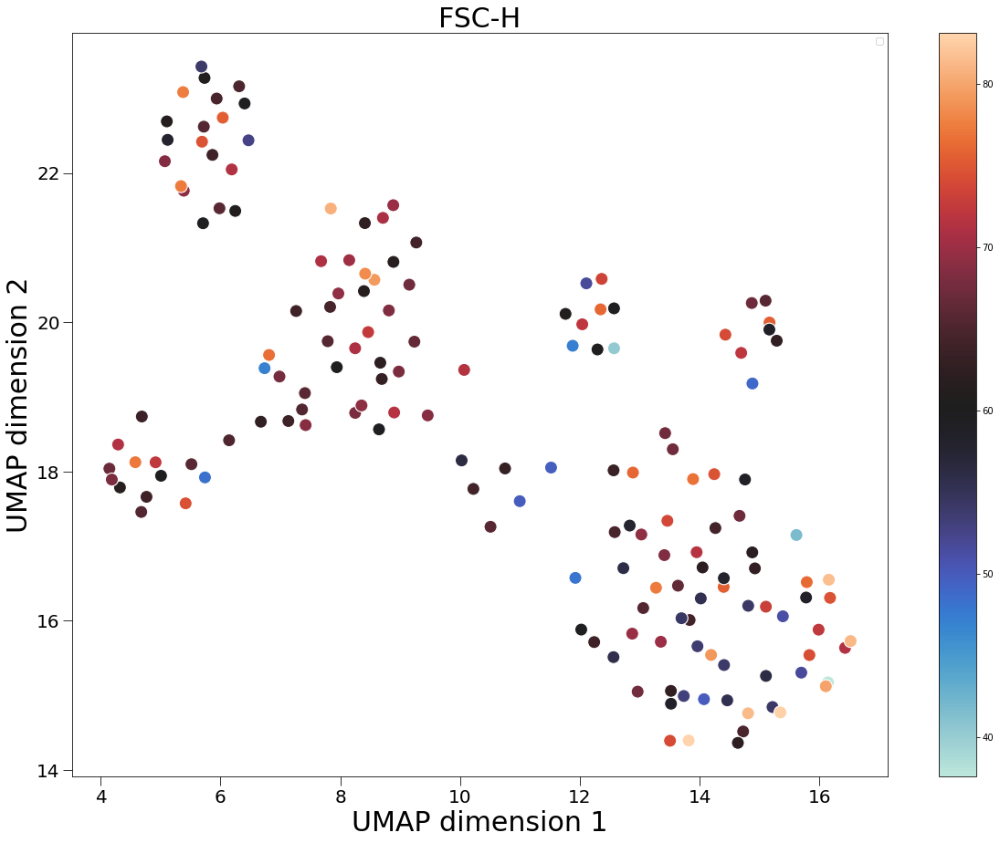

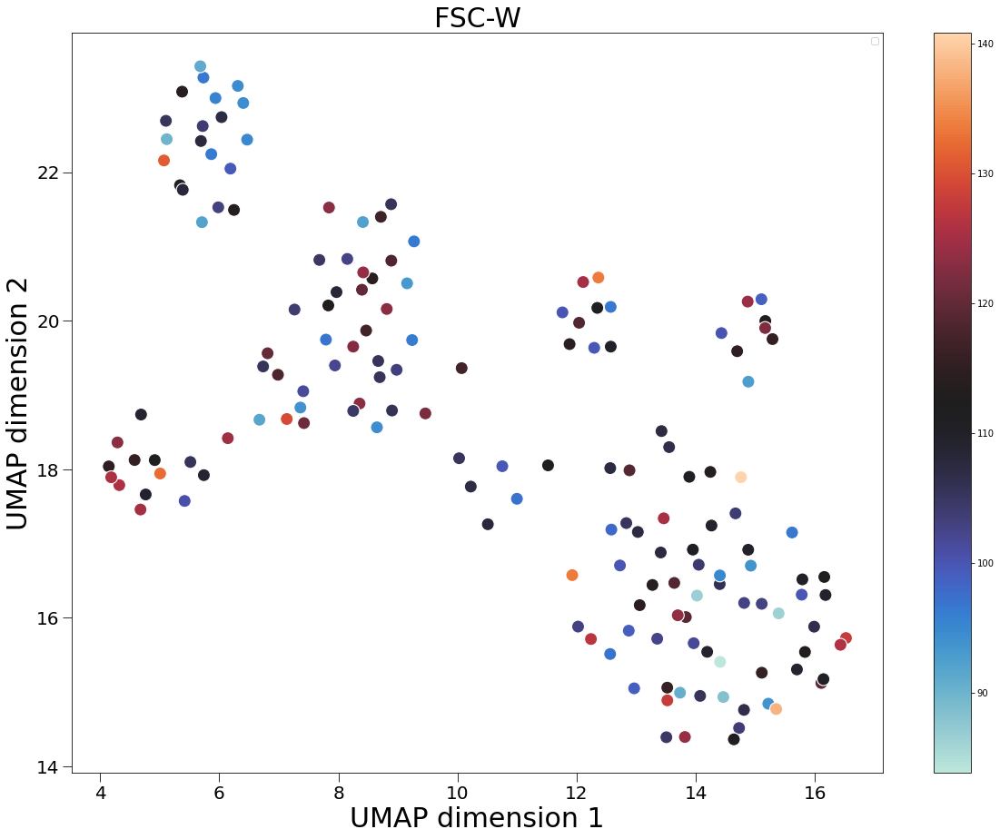

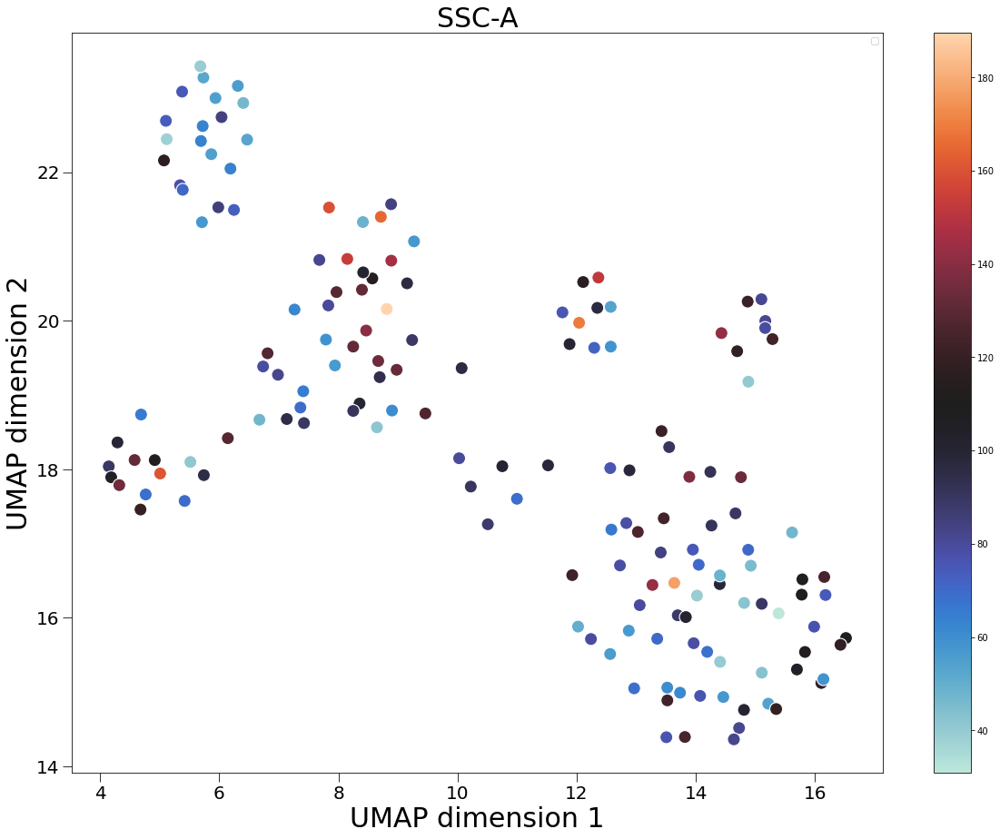

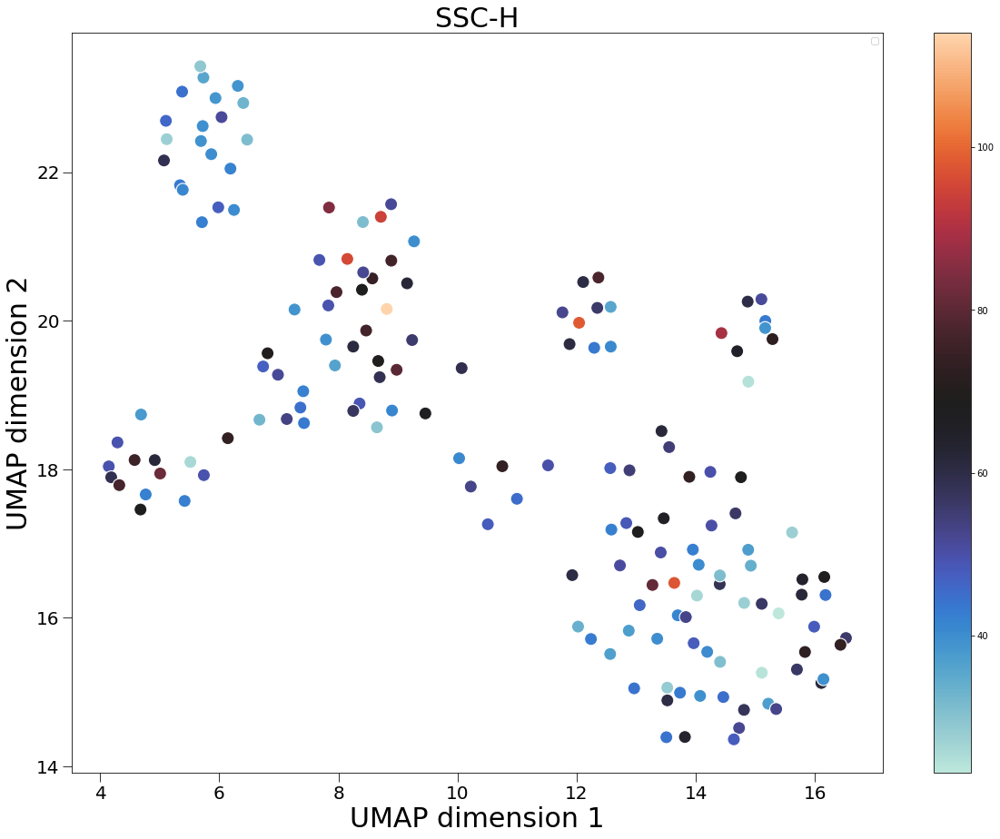

...

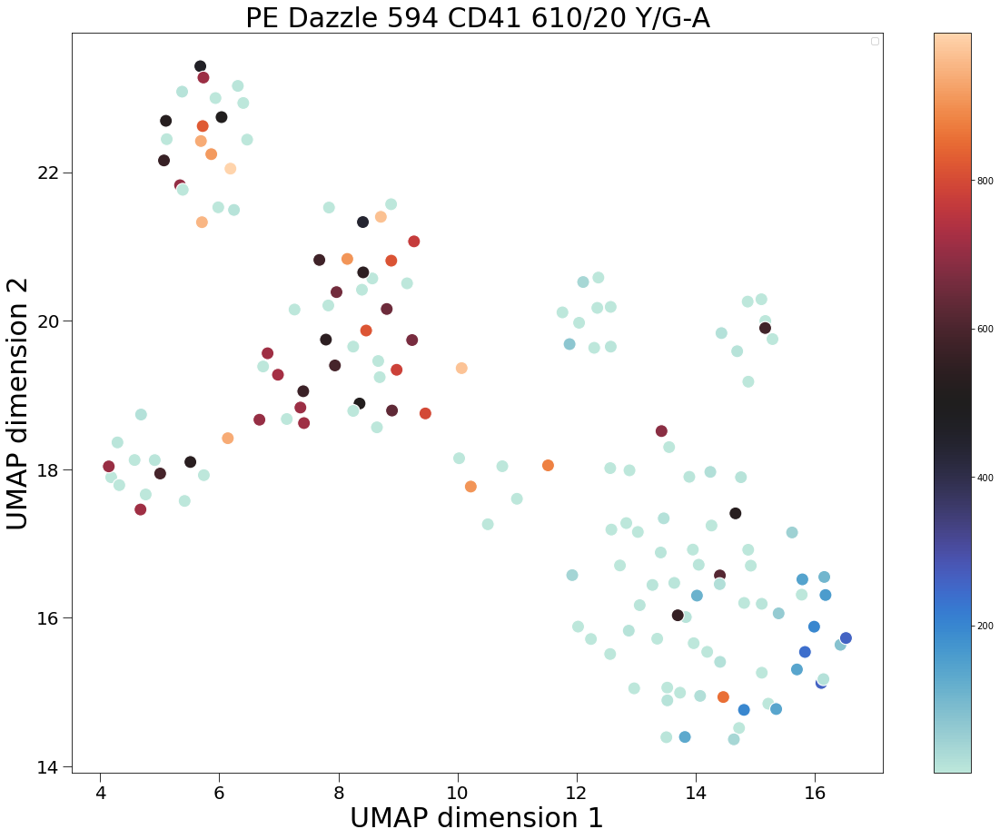

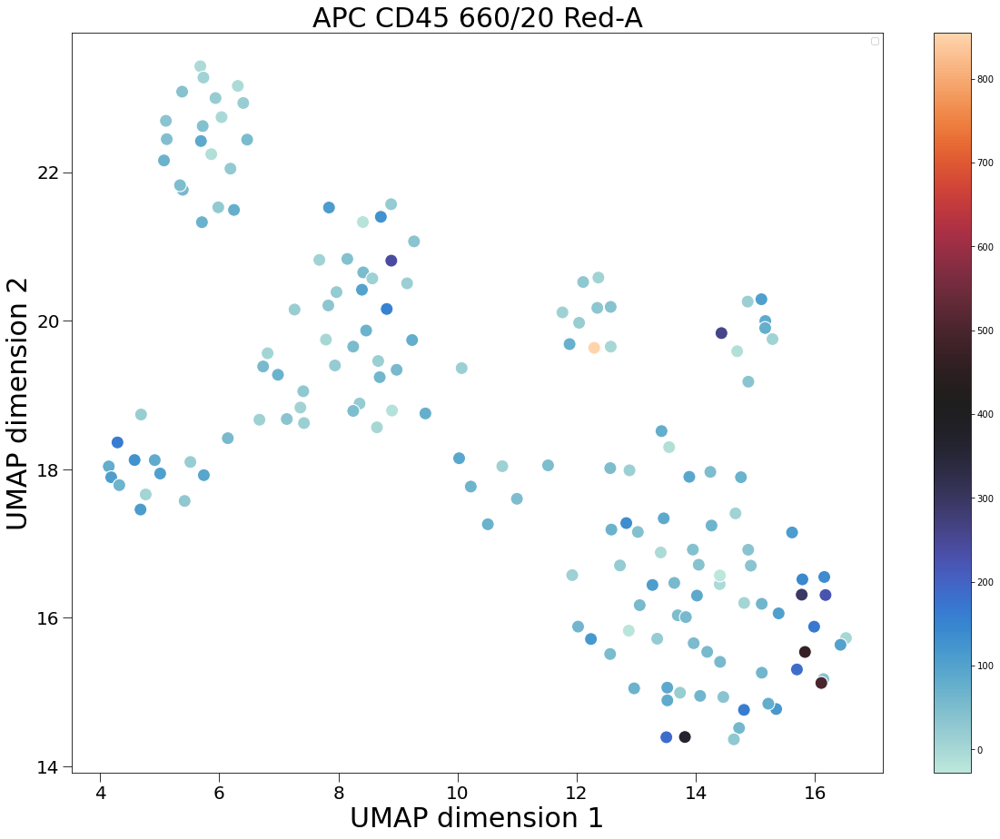

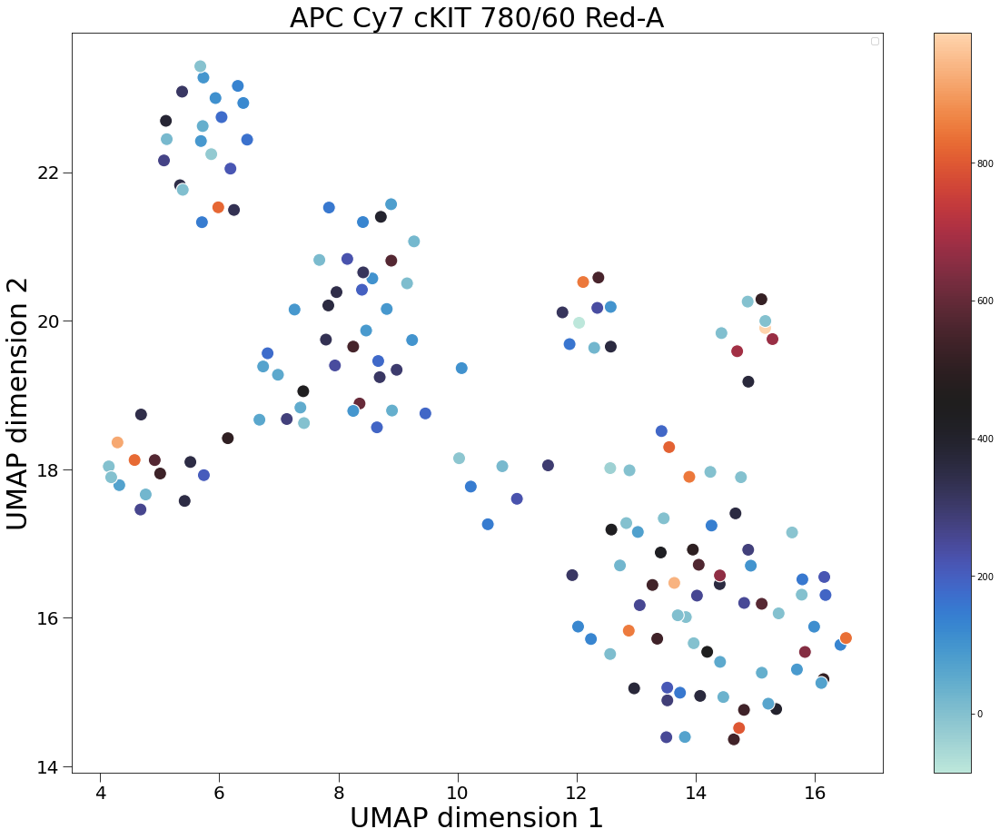

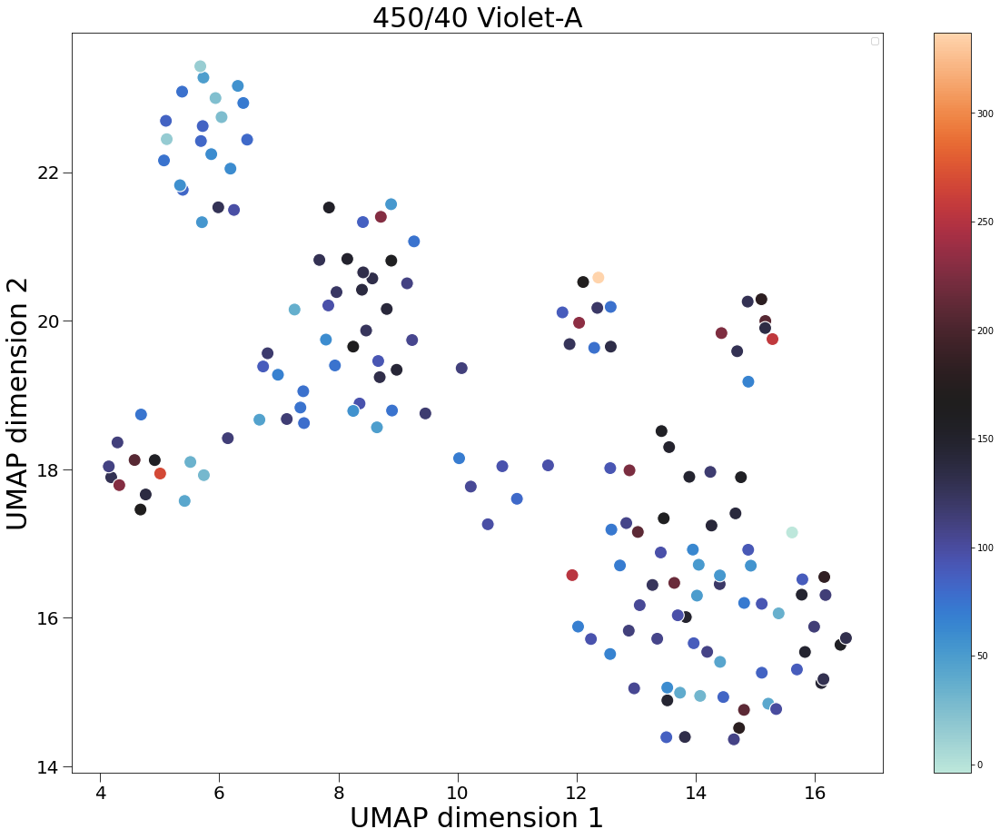

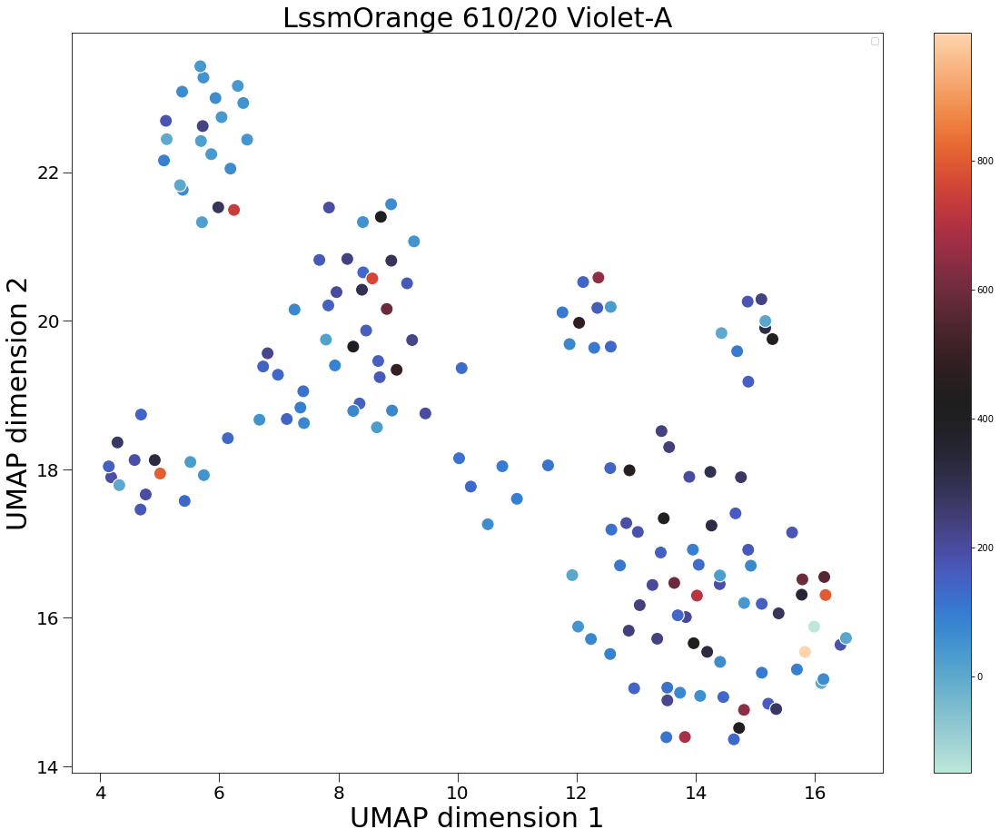

In [11]:
not_found_genes = []
for prop in properties:
        
    fig,ax = plt.subplots(1,1,figsize=[20,15])
        
    hue = adata.obs.loc[:,prop]
    order = np.argsort(hue)

    sns.scatterplot(x=adata.obsm["X_umap"][order,0],y=adata.obsm["X_umap"][order,1],hue=hue[order],s=200,ax=ax,palette=PALETTE)
    plt.colorbar(cm.ScalarMappable(norm=Normalize(min(hue),max(hue)), cmap=PALETTE),ax=ax)
    ax.legend([])
    sctplot.plot_base(ax,labels=["UMAP dimension 1","UMAP dimension 2"],title=prop,legend_pos=(0.01,0.01),legend_markerscale=3,legend=False)
                    
    fig.savefig(DIRECTORY+"Plots/UMAP_flow_cytometry/"+prop.replace("/","-")+".pdf",bbox_inches="tight",transparent=True)

## Save results

In [12]:
adata.write(DIRECTORY+"Results/QC.h5ad")

# Times

We also perform the analysis by times.

## HVGs and PCs

1. For the global projection, we make an automatic selection of highly varying genes according to the Seurat algorithm.
2. The variance plot show an elbow at 10 PCA. We chose that number of PCA for the downstream analysis: construction of the nearest neighbours graph and the UMAP projection.

In [13]:
adata = scp.read(DIRECTORY+"Results/QC.h5ad")

In [14]:
adatas = [adata[adata.obs["Condition"]==condition] for condition in np.sort(adata.obs["Condition"].unique())]

In [15]:
for adata in adatas:
    scp.pp.highly_variable_genes(adata,layer=HVGS["layer"],flavor=HVGS["flavor"],n_top_genes=HVGS["n_top_genes"])
    scp.pp.pca(adata,n_comps=50,use_highly_variable=True)

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


In [16]:
for adata in adatas:
    scthyp.pca_permutation_test(adata,use_HVGs=True,n_perms=50)

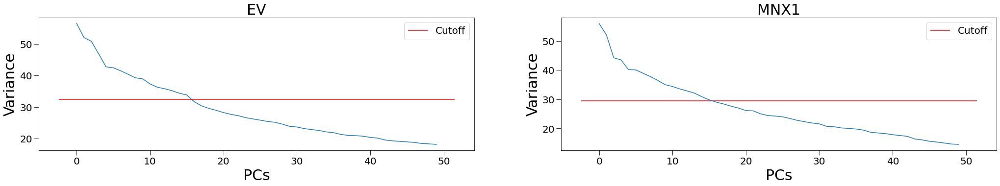

In [17]:
fig,ax = plt.subplots(1,2,figsize=[35,5])

for time,adata in enumerate(adatas):
    sns.lineplot(range(len(adata.uns["pca"]["variance"])),adata.uns["pca"]["variance"],ax=ax[time])
    sctplot.hline(ax[time],adata.uns["pca"]["variance_randomized_mean"].max(),label="Cutoff",color="r")
    sctplot.plot_base(ax[time],title=adata.obs["Condition"].values[0],labels=["PCs","Variance"])

fig.savefig(DIRECTORY+"Plots/Condition/DR_PCs_selection.pdf",bbox_inches="tight",transparent=True)
fig.show()

## UMAP projection by tags 

With the PCs selected, we can generate a neighbors graph and project over a UMAP plot.

In [18]:
for adata in adatas:
    scp.pp.neighbors(adata,metric=METRIC,n_pcs=PCA_CONDITION,knn=KNN)
    scp.tl.umap(adata)

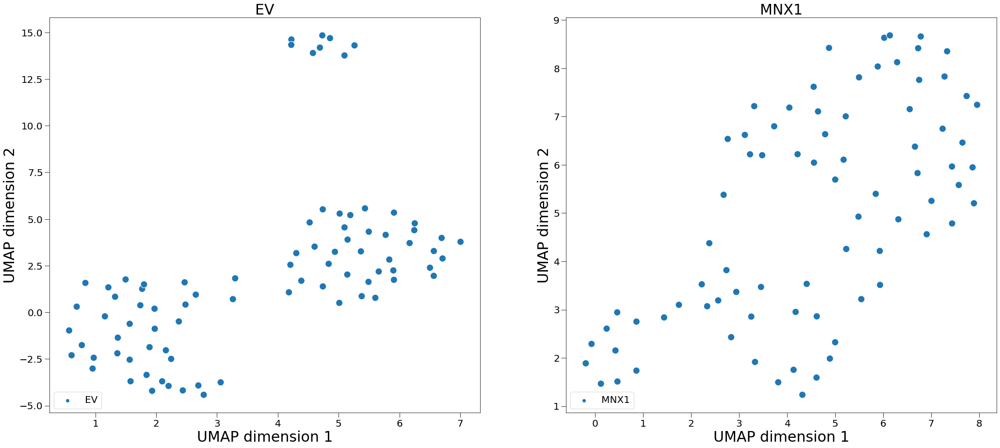

In [19]:
fig,ax = plt.subplots(1,2,figsize=[35,15])
        
for time,adata in enumerate(adatas):
    sns.scatterplot(x=adata.obsm["X_umap"][:,0],y=adata.obsm["X_umap"][:,1],hue=adata.obs["Condition"],s=200,ax=ax[time])
    sctplot.plot_base(ax[time],title=adata.obs["Condition"].values[0],labels=["UMAP dimension 1","UMAP dimension 2"],legend_pos=(0.01,0.01))

fig.savefig(DIRECTORY+"Plots/Condition/UMAP_tags.pdf",bbox_inches="tight",transparent=True)

## UMAP projection of relevant genes

We projected over the UMAP a list of relevant genes that will be helpful for the future annotation of the dataset. Notice that some of the genes may not be found, this may be caused because they are tagged with a different name or that no expression at all from this genes has been detected.

In [20]:
genes = pd.read_excel("../Shared_data/Marker_genes_scRNAseq_Gx.xlsx",header=None)

print("Genes selected for projection: ",np.sort(genes.values[:,0]))

Genes selected for projection:  ['Bcl11b' 'Bmi1' 'Cbfa2t3' 'Ccn3' 'Cd24a' 'Cd34' 'Cd48' 'Cd93' 'Cdh5'
 'Cebpa' 'Ebf1' 'Esam' 'Etv6' 'Fcgr3' 'Flt3' 'Foxo3' 'Gata1' 'Gata2'
 'Gata3' 'Gfi1b' 'Hbb-bh1' 'Hbb-bs' 'Hbb-bt' 'Hbb-y' 'Hlf' 'Hoxa9' 'Hoxb4'
 'Ifitm1' 'Ifitm2' 'Ifitm3' 'Itga2b' 'Kdr' 'Kit' 'Klf1' 'Ly6a' 'Ly6e'
 'Mecom' 'Meis1' 'Mllt3' 'Nkx2-5' 'Notch1' 'Notch2' 'Pax5' 'Pcgf2'
 'Pdgfra' 'Pecam1' 'Ptprc' 'Robo4' 'Runx1' 'Slamf1' 'Snap25' 'Spi1' 'Spn'
 'Srrm4' 'Stmn2' 'T' 'Tbx5' 'Tcf3']


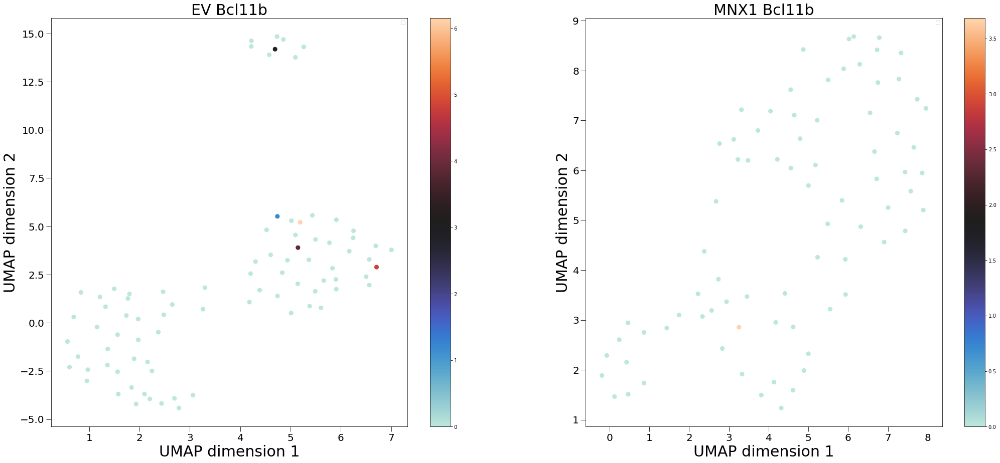

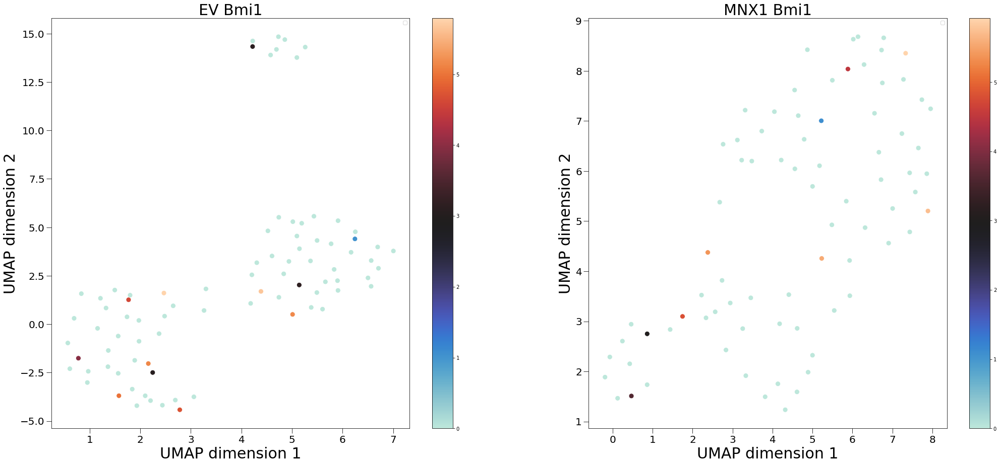

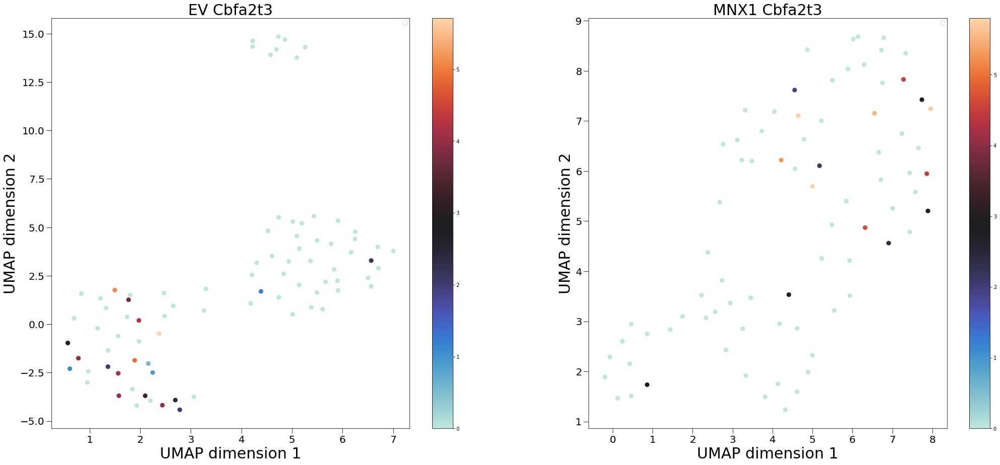

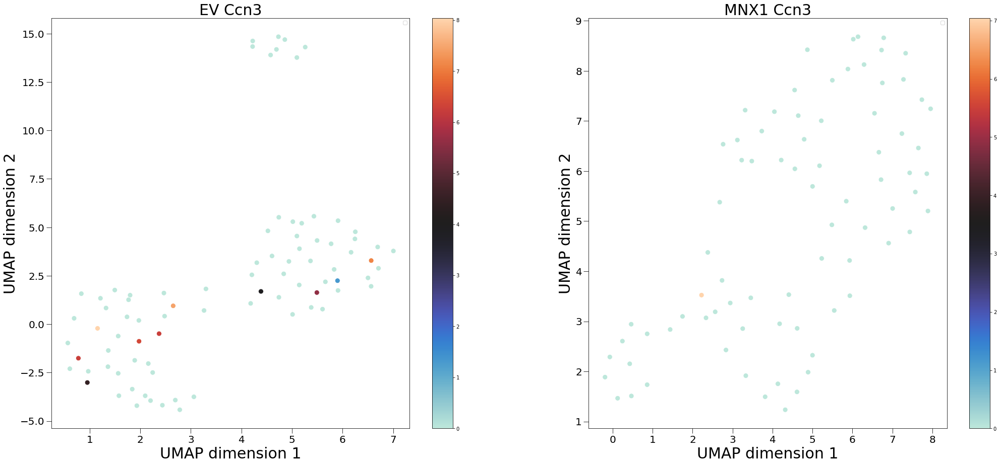

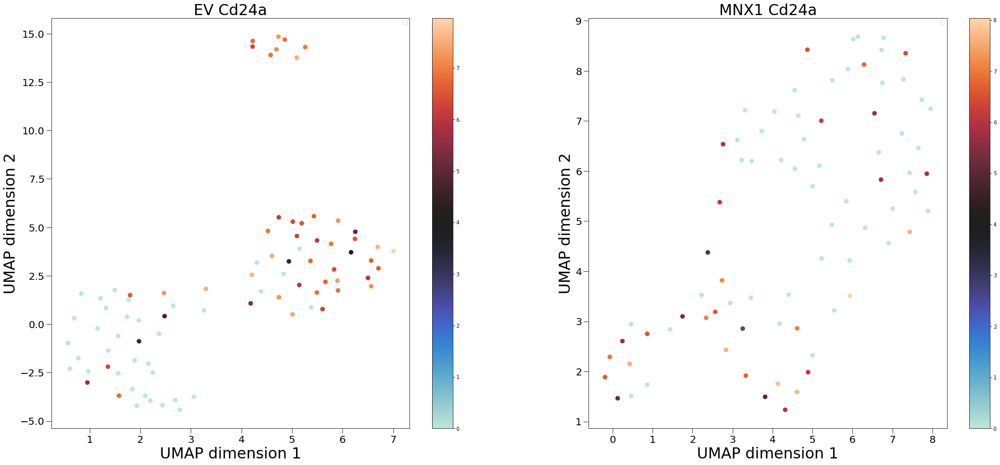

...

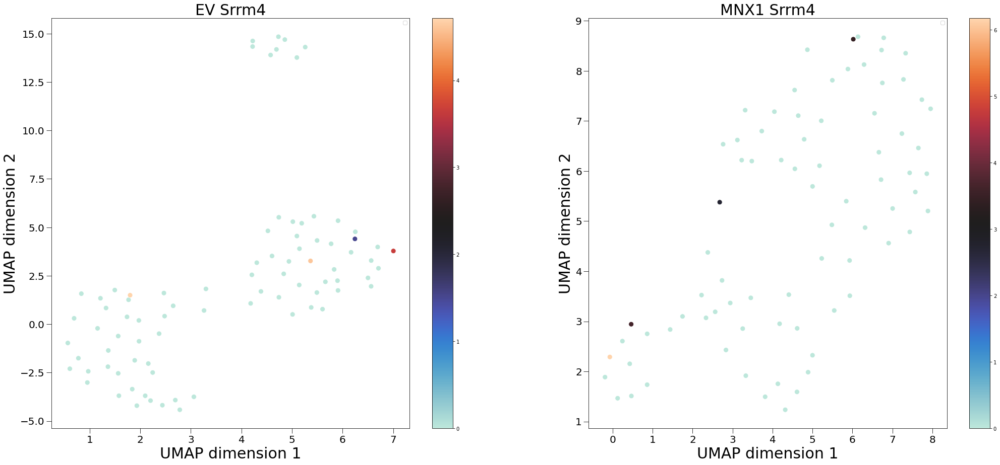

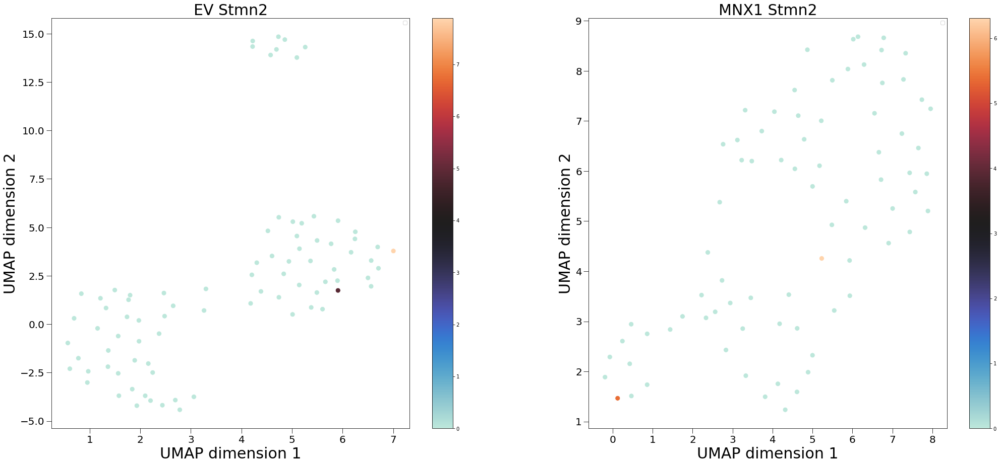

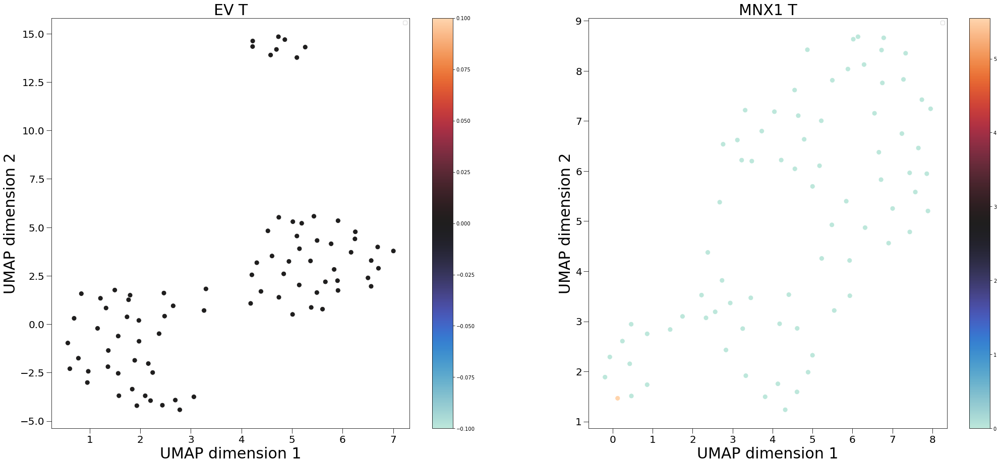

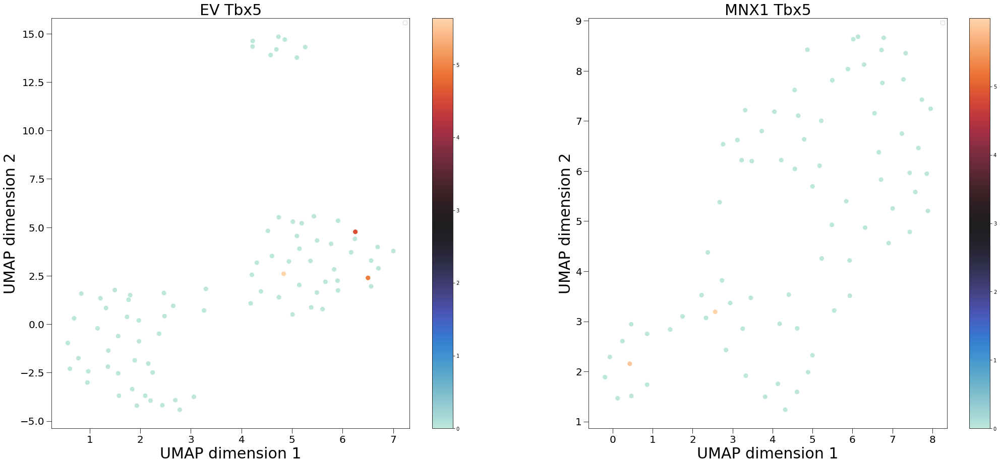

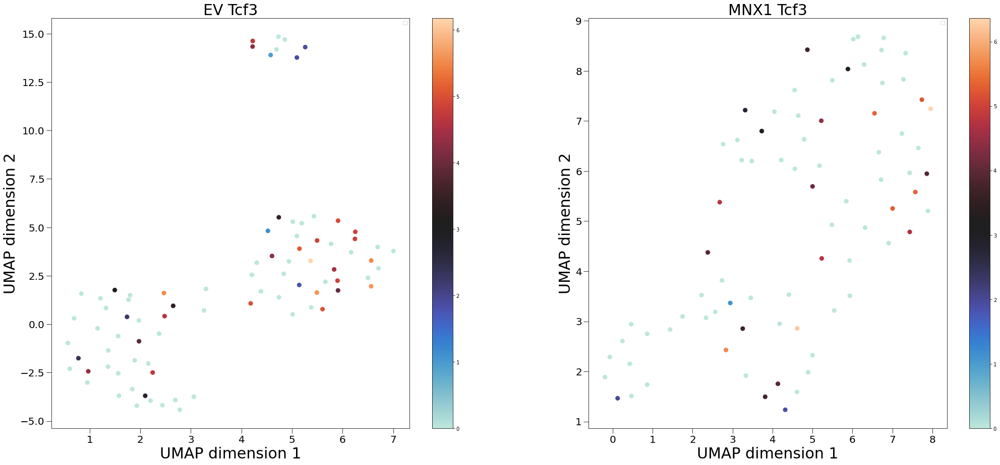

In [21]:
not_found_genes = []

for gene in np.sort(genes.values[:,0]):

    if gene in np.sort(adata.var.loc[:,"gene_name"].values):
        fig,ax = plt.subplots(1,2,figsize=[35,15])

        for time,adata in enumerate(adatas):
            hue = np.array(adata[:,adata.var["gene_name"]==gene].X.todense())[:,0]
            order = np.argsort(hue)

            sns.scatterplot(x=adata.obsm["X_umap"][order,0],y=adata.obsm["X_umap"][order,1],s=100,hue=hue[order],ax=ax[time],palette=PALETTE)
            plt.colorbar(cm.ScalarMappable(norm=Normalize(min(hue),max(hue)), cmap=PALETTE),ax=ax[time])
            ax[time].legend([])
            sctplot.plot_base(ax[time],title=adata.obs["Condition"].values[0]+" "+gene,labels=["UMAP dimension 1","UMAP dimension 2"],legend_pos=(0.01,0.01),legend_markerscale=3,legend=False)

        fig.savefig(DIRECTORY+"Plots/Condition/UMAP_genes/"+gene+".pdf",bbox_inches="tight",transparent=True)
    else:
        not_found_genes.append(gene)

    #print("Genes from the list not found for projection: ",not_found_genes)

## UMAP projection of flow cytometry properties

We also plot the the data against the cytommetry properties used for the selection of the cells of the experiment.

In [27]:
properties = ['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H',
       'SSC-W', 'PE Dazzle 594 CD41 610/20 Y/G-A', 'APC CD45 660/20 Red-A',
       'APC Cy7 cKIT 780/60 Red-A', '450/40 Violet-A',
       'LssmOrange 610/20 Violet-A']

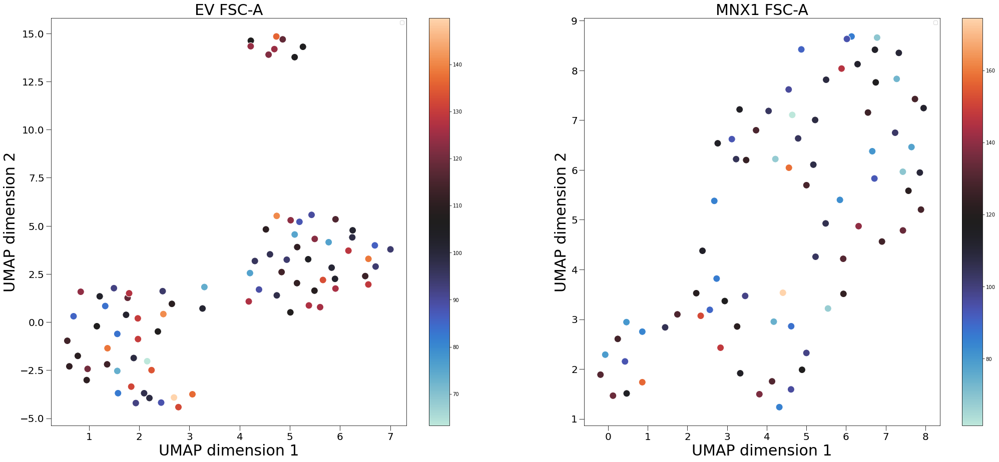

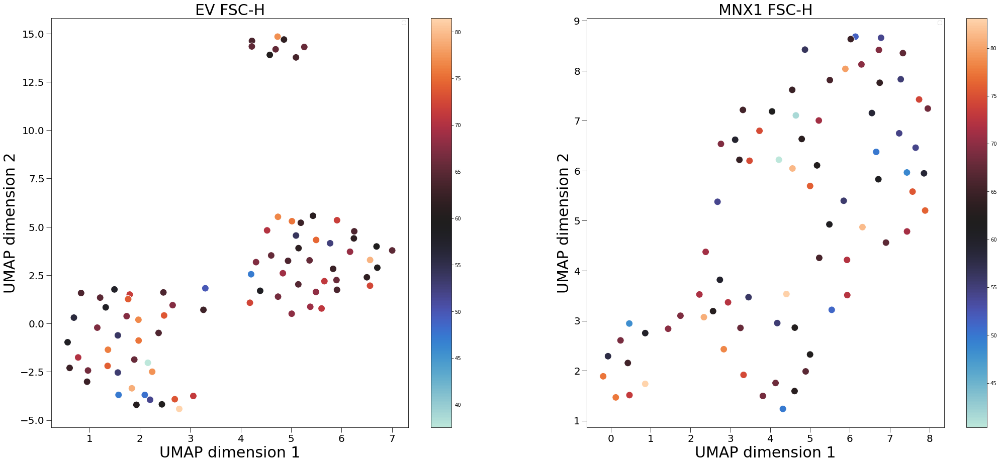

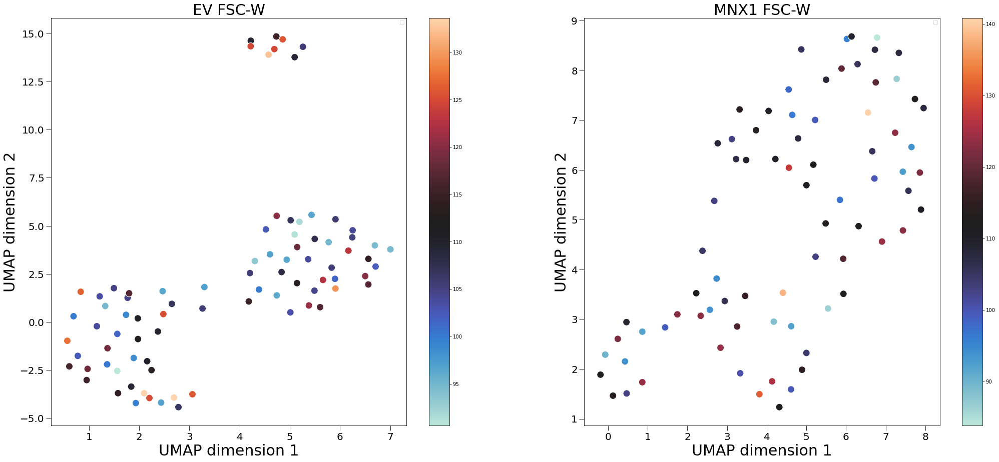

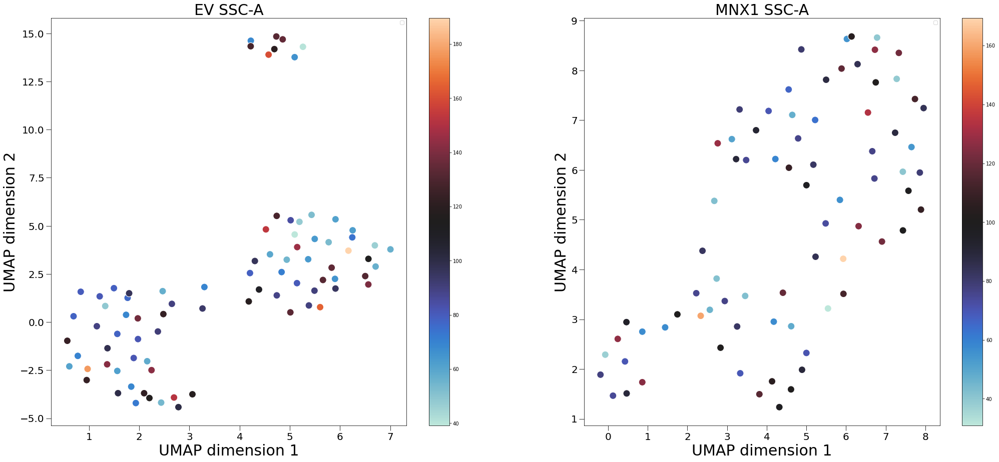

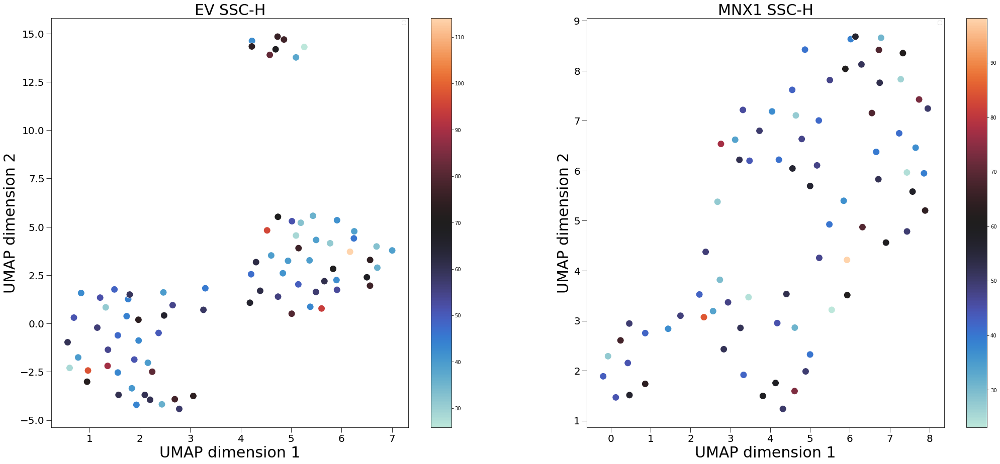

...

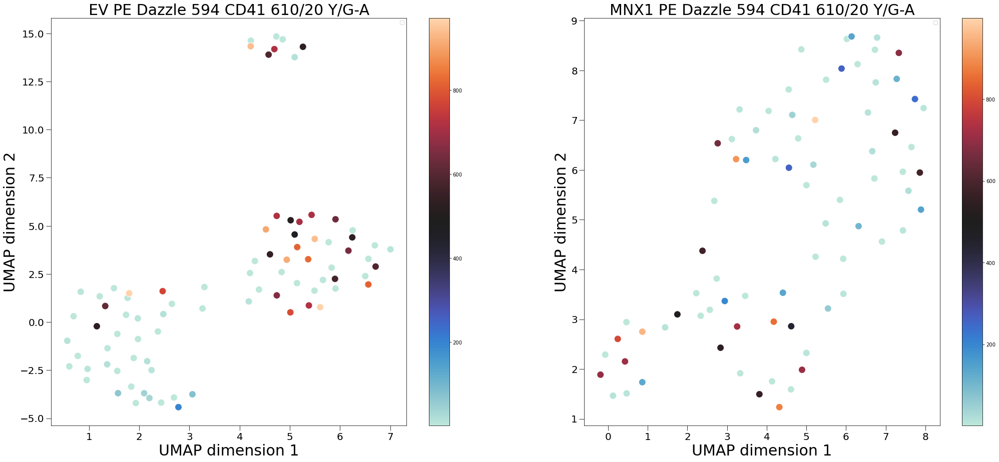

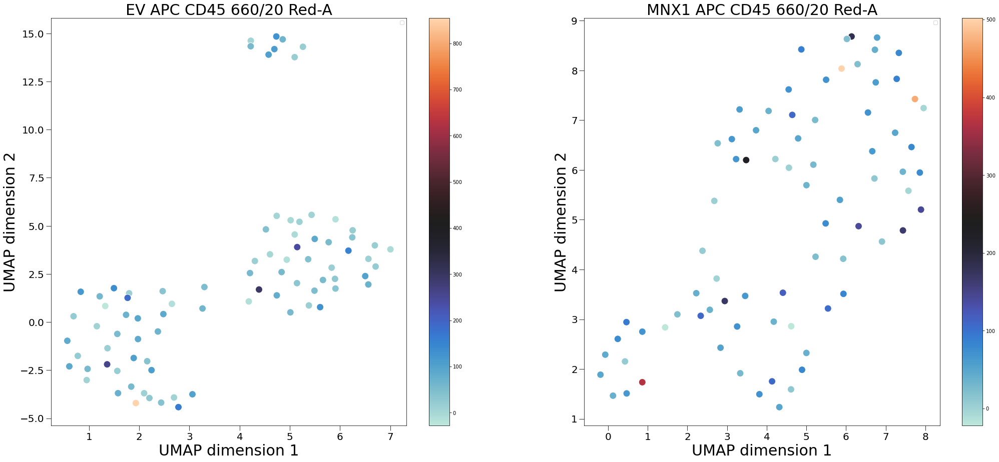

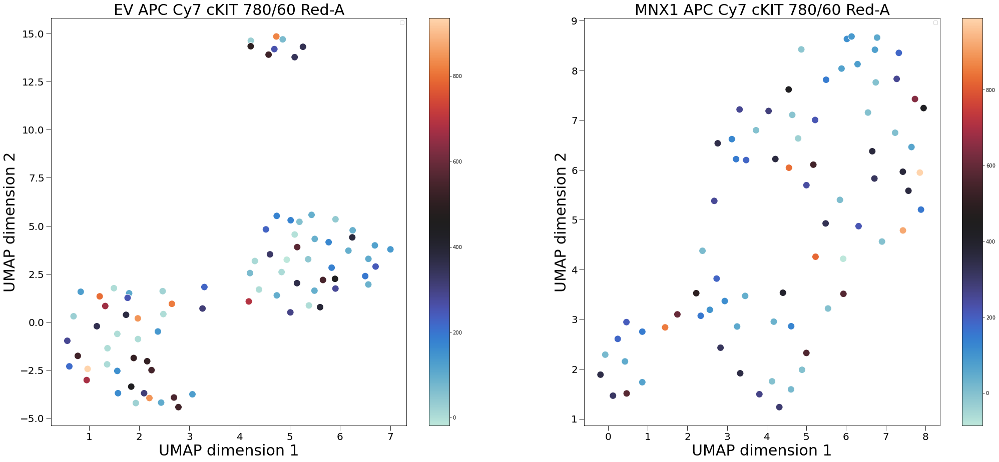

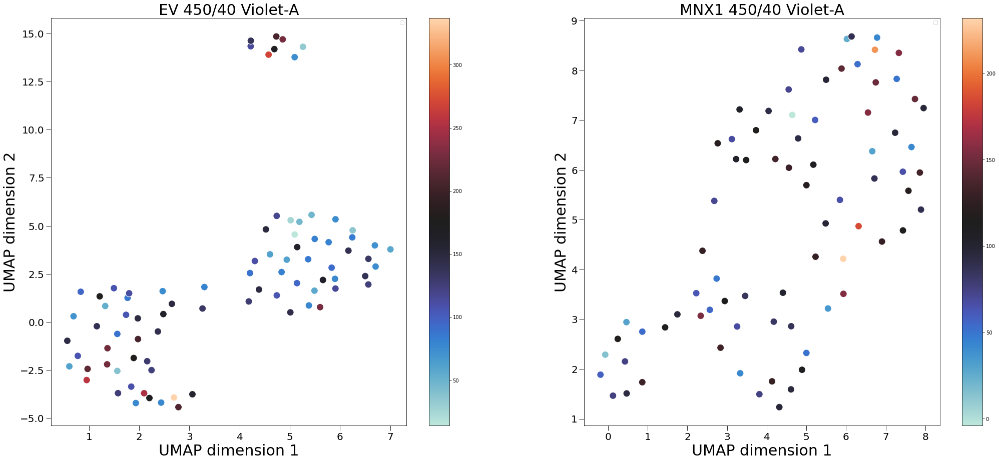

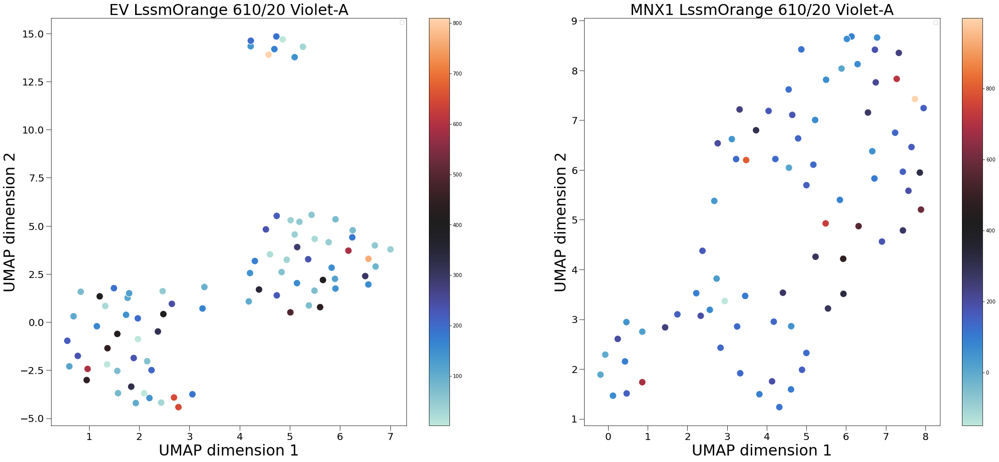

In [28]:
not_found_genes = []
for prop in properties:

    fig,ax = plt.subplots(1,2,figsize=[35,15])

    for time,adata in enumerate(adatas):
    
        hue = adata.obs.loc[:,prop]
        order = np.argsort(hue)

        sns.scatterplot(x=adata.obsm["X_umap"][order,0],y=adata.obsm["X_umap"][order,1],hue=hue[order],s=200,ax=ax[time],palette=PALETTE)
        plt.colorbar(cm.ScalarMappable(norm=Normalize(min(hue),max(hue)), cmap=PALETTE),ax=ax[time])
        ax[time].legend([])
        sctplot.plot_base(ax[time],title=adata.obs["Condition"].values[0]+" "+prop,labels=["UMAP dimension 1","UMAP dimension 2"],legend_pos=(0.01,0.01),legend_markerscale=3,legend=False)

    fig.savefig(DIRECTORY+"Plots/Condition/UMAP_flow_cytometry/"+prop.replace("/","-")+".pdf",bbox_inches="tight",transparent=True)
    

## Save results

In [29]:
for time,adata in enumerate(adatas):
    adata.write(DIRECTORY+"Results/QC_"+adata.obs["Condition"].values[0]+".h5ad")